# EDA: Time-Lapse 

In [ ]:
# !pip install plotly
# !pip install gif
# !pip install gif[plotly]
# !pip install geopandas
# !pip install plotly-geo
# !pip install pyshp
# !pip install shapely

## Imports 

In [2]:
import pandas as pd
import plotly.express as px
import gif
import json
from urllib.request import urlopen

## Load in Data 

In [3]:
covid_data = []
folder_name = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/'
covid_data.append(
    folder_name + 'time_series_covid19_confirmed_US.csv'
)
df = pd.read_csv(
    covid_data[0]
)

In [ ]:
df.head()

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,Combined_Key,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,...,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,4/20/21,4/21/21,4/22/21,4/23/21,4/24/21,4/25/21,4/26/21,4/27/21,4/28/21,4/29/21,4/30/21,5/1/21,5/2/21,5/3/21,5/4/21,5/5/21,5/6/21,5/7/21,5/8/21,5/9/21,5/10/21,5/11/21,5/12/21,5/13/21,5/14/21,5/15/21,5/16/21,5/17/21,5/18/21,5/19/21
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,"Autauga, Alabama, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,6715,6723,6727,6734,6740,6748,6750,6760,6763,6763,6773,6793,6819,6835,6876,6879,6882,6889,6890,6897,6904,6907,6909,6910,6910,6914,6914,6918,6918,6920,6920,6926,6928,6938,6971,7001,7005,7010,7015,7017
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,"Baldwin, Alabama, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,20617,20631,20638,20652,20670,20674,20701,20714,20723,20730,20764,20787,20815,20833,20838,20847,20863,20875,20897,20921,20941,20966,20983,20993,20993,21035,21093,21107,21123,21131,21135,21154,21170,21191,21290,21392,21411,21422,21444,21467
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,"Barbour, Alabama, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2247,2247,2249,2252,2257,2262,2264,2271,2271,2271,2275,2284,2289,2292,2296,2296,2296,2297,2298,2299,2300,2302,2302,2302,2302,2307,2307,2307,2307,2308,2308,2310,2314,2317,2319,2320,2320,2320,2322,2324
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,"Bibb, Alabama, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2562,2562,2564,2564,2559,2560,2560,2563,2563,2567,2569,2569,2573,2578,2582,2584,2584,2588,2591,2593,2594,2596,2596,2597,2597,2604,2604,2604,2605,2607,2607,2609,2612,2615,2630,2645,2647,2648,2651,2652
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,"Blount, Alabama, US",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,6480,6483,6488,6497,6507,6511,6519,6529,6532,6532,6548,6556,6563,6570,6570,6571,6574,6581,6595,6607,6613,6616,6619,6621,6621,6635,6645,6651,6656,6660,6661,6678,6680,6694,6750,6771,6773,6776,6794,6808


## Clean and Reformat Dataframe 

In [4]:
df.drop(columns=['UID', 'iso2', 'iso3', 'code3', 'Country_Region', 'Lat', 'Long_', 'Combined_Key', 'Province_State', 'Admin2'], inplace=True)

In [5]:
df.FIPS = df.FIPS.apply(lambda x: str(x).strip('.0').zfill(5))

In [6]:
df = df.groupby('FIPS').agg('sum')
dates = list(df.columns)
df['FIPS'] = df.index
df_t = pd.melt(df, id_vars=['FIPS'], value_vars=dates)

In [7]:
df_t['variable'] = df_t['variable'].str.replace('/', '-')

## Time-Lapse GIF 

In [ ]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

@gif.frame
def plot(date, i):
    fig = px.choropleth(df_t[df_t['variable'] == date],
                        locations='FIPS',
                        color='value',
                        geojson = counties,
                        scope='usa',
                        color_continuous_scale='Peach',
                        range_color=[0, 50000],
                title = 'Covid Cases by County over Time', 
                        )
    fig.update_traces(marker_line_width = 0.5, marker_line_color = 'rgba(0,0,0,0.1)')
    if i % 5 == 0:
    fig.add_annotation(x = 0, y = 1.15, text = date, showarrow = False)
    return fig
frames = []
for i in range(len(df_t.variable.unique())):
    date =  df_t.variable.unique()[i]
    frame = plot(date, i)
    frames.append(frame)
gif.save(frames, 'lapse.gif', duration = 500)

# Credit goes to Devin who helped me troubleshoot the timelapse piece of this. Thanks, Devin!

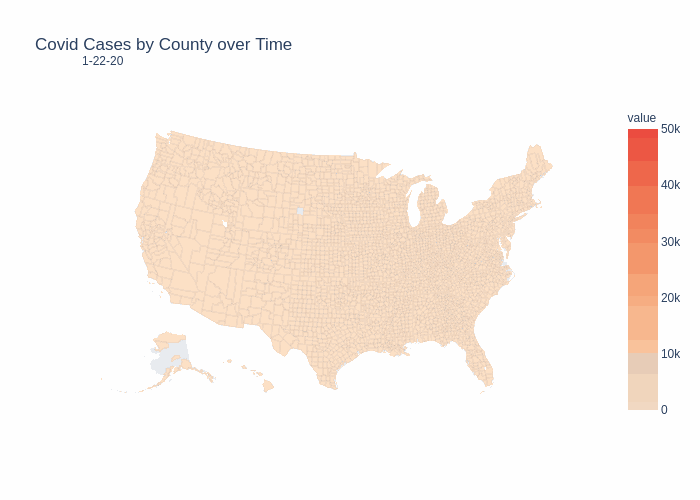

The gif above is the output for this code. I ran it on Google Colab and it takes over half an hour to run, so here it is in a markdown file.

Initially, I attempted to make a choropleth map with a slider at the bottom that could show the number of COVID cases of each county at a national level.  However, it wouldn't output any results to the map, so Devin came up with the idea to create a gif insted. 